# VISION: Pratical work
## Implementation of two optical flow methods
### Student : Shubhamkumar Patel

In [34]:
from middlebury import *
import numpy as np 
import os
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
import cv2

In [593]:
## Useful functions 

def quiver_show(we, n=5, color="white", I1=None, I2=None, title="Quiver"):
    U = we[:,:,0]
    V = we[:,:,1]
    X, Y = np.meshgrid(list(range(U.shape[1])), list(range(U.shape[0])))
    plt.figure(figsize=(10,10))
    plt.imshow(computeColor(we, False))
    plt.quiver(X[::n, ::n], Y[::n, ::n], U[::n, ::n], V[::n, ::n], color=color)
    plt.axis("off")
    plt.title(title)
    if I1 is None:
        plt.show()
    if I1 is not None:
        plt.imshow(I1 - I2, alpha=0.75, cmap="hot")
        plt.show()

def quiver_plot(Ir, we, n=1, color="white"):
    U = we[:,:,0]
    V = we[:,:,1]
    X, Y = np.meshgrid(list(range(Ir.shape[1])), list(range(Ir.shape[0])))
    plt.figure(figsize=(10,10))
    plt.imshow(computeColor(we, False))
    plt.quiver(X[::n, ::n], Y[::n, ::n], U[::n, ::n], V[::n, ::n], color=color)
    plt.title("Quiver")
    plt.show()
    plt.figure(figsize=(10,10))
    plt.imshow(Ir)
    plt.title("Reference")
    plt.show()
    
def plot(Ir, we):
    plt.figure(figsize=(10,10))
    plt.imshow(computeColor(we, False))
    plt.show()
    plt.figure(figsize=(10,10))
    plt.imshow(Ir)
    plt.show()

## 1. Horn-Schunck Method

### 1.1 Gradhorn

In [36]:
def gradhorn(I1, I2):
    # kernel for computing d/dx
    kX = np.array([[1, -1], [1, -1]]) / 4
    # kernel for computing d/dy
    kY = np.array([[1, 1], [-1, -1]]) / 4
    kT = np.ones((2, 2)) / 4

    Ix = convolve2d(I1 + I2, kX, "same") 
    Iy = convolve2d(I1 + I2, kY, "same")
    It = convolve2d(I2 - I1, kT, "same")
    return Ix, Iy, It

In [37]:
# While loading data we want to read all input images as grayscale images
I1 = cv2.imread("../data/square/square9.png", 0).astype(np.float32)
I2 = cv2.imread("../data/square/square10.png", 0).astype(np.float32)
Ix, Iy, It = gradhorn(I1, I2)

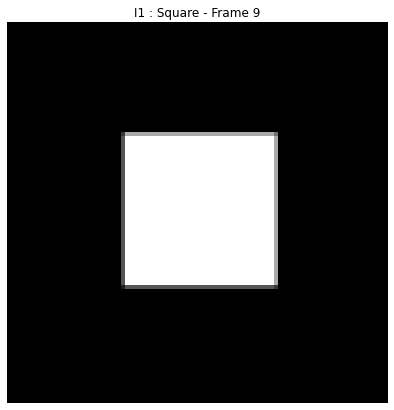

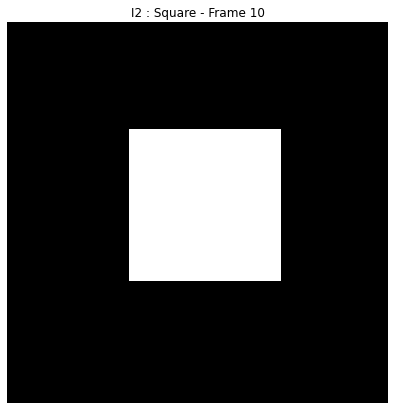

In [38]:
# Input Frames
plt.figure(figsize=(7,7))
plt.imshow(I1, cmap="gray")
plt.axis('off')
plt.title("I1 : Square - Frame 9")
plt.show()
plt.figure(figsize=(7,7))
plt.title("I2 : Square - Frame 10")
plt.imshow(I2, cmap="gray")
plt.axis('off')
plt.show()

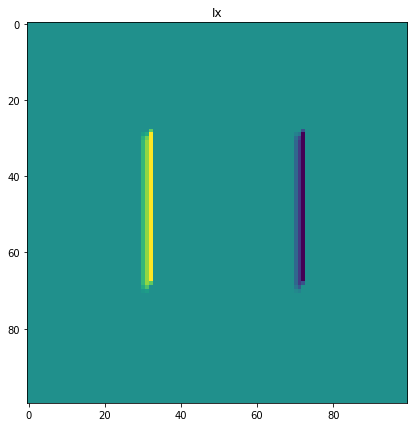

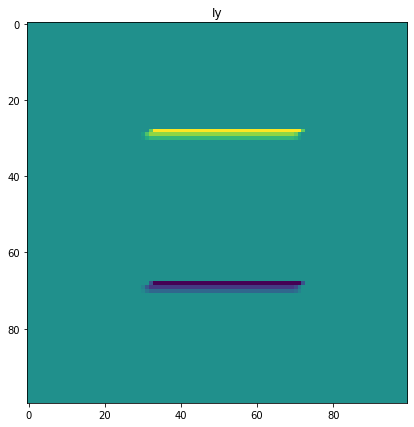

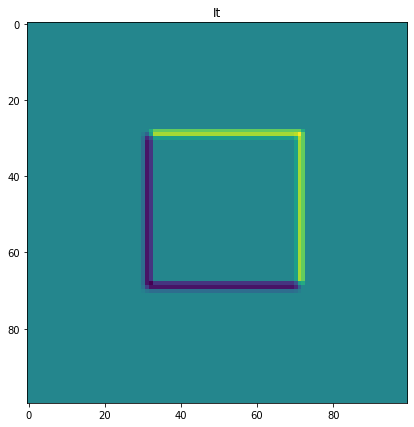

In [39]:
# Ix, Iy, It After Gradhorn
plt.figure(figsize=(7,7))
plt.imshow(Ix, label="Ix")
plt.title("Ix")
plt.show()
plt.figure(figsize=(7,7))
plt.imshow(Iy, label="Iy")
plt.title("Iy")
plt.show()
plt.figure(figsize=(7,7))
plt.imshow(It, label="It")
plt.title("It")
plt.show()

### 1.2 Horn

In [105]:
def horn(I1, I2, alpha, N):
    Ix, Iy, It = gradhorn(I1, I2)
    A = np.matrix([[1, 2, 1],
                   [2, 0, 2],
                   [1, 2, 1]]) / 12

    u = np.zeros(I1.shape)
    v = np.zeros(I1.shape)

    for k in range(0, N - 1):
        u = convolve2d(u, A, "same")
        v = convolve2d(v, A, "same")

        tmp = np.divide(Ix * u + Iy * v + It, alpha + Ix**2 + Iy**2)

        u = u - Ix * tmp
        v = v - Iy * tmp

    w = np.zeros([I1.shape[0], I1.shape[1], 2])
    w[:, :, 0] = u
    w[:, :, 1] = v
    return w

In [109]:
I1 = cv2.imread("../data/mysine/mysine9.png", 0).astype(np.float32)
I2 = cv2.imread("../data/mysine/mysine10.png", 0).astype(np.float32)

In [539]:
## Correct Flow (Reference)
wr = readflo("../data/mysine/correct_mysine.flo")

## Computed Flow using horn (Estimated)
we = horn(I1, I2, 0.0001, 1000)

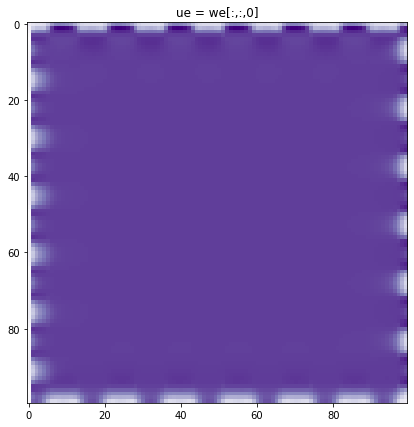

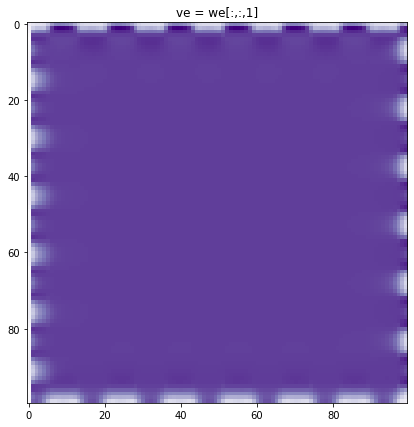

In [540]:
## Estimated optical flow over x and y directions
plt.figure(figsize=(7,7))
plt.imshow(we[:,:,0], cmap="Purples")
plt.title("ue = we[:,:,0]")
plt.show()

plt.figure(figsize=(7,7))
plt.imshow(we[:,:,1])
plt.imshow(we[:,:,0], cmap="Purples")
plt.title("ve = we[:,:,1]")
plt.show()

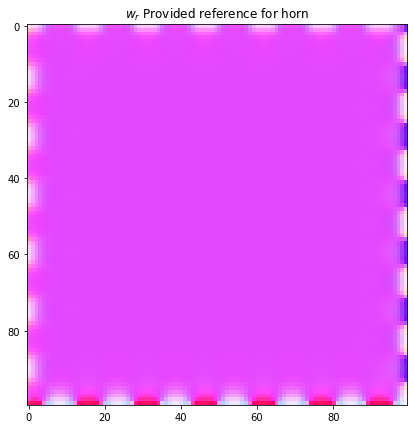

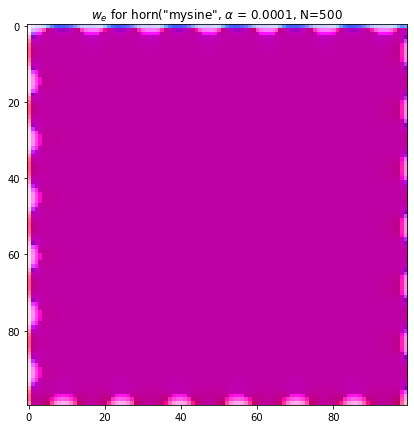

In [562]:
## Reference for Horn on square data
Ir = cv2.imread("../data/mysine/mysine_horn.png")

plt.figure(figsize=(7,7))
plt.imshow(Ir)
plt.title(r'$w_r$ Provided reference for horn')
plt.show()

plt.figure(figsize=(7,7))
plt.imshow(computeColor(we, False))
plt.title(r'$w_e$ for horn("mysine", $\alpha$ = {}, N={}'.format(0.0001, 500))
plt.show()

### 1.3 Test and Optimize

In [542]:
### Angular error function 

In [543]:
def error(wr, we):
    angular_error = np.mean(np.arccos((1 + np.dot(we.flatten(), wr.flatten())) / 
                                (np.sqrt(1 + np.linalg.norm(wr)**2) * np.sqrt(1 + np.linalg.norm(we)**2))))
    
    mean_squared_error = np.mean((wr - we)**2)
    
    euclidean_error = np.mean(np.sqrt((we[:,:,0] - wr[:,:,0])**2 + (we[:,:,1] - wr[:,:,1])**2))
       
    return angular_error, euclidean_error, mean_squared_error

#### Testing Gradhorn() on square data

In [544]:
I1 = cv2.imread("../data/square/square9.png", 0).astype(np.float32)
I2 = cv2.imread("../data/square/square10.png", 0).astype(np.float32)
Ix, Iy, It = gradhorn(I1, I2)

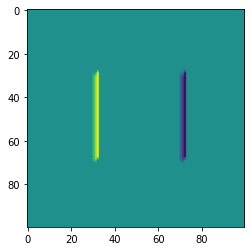

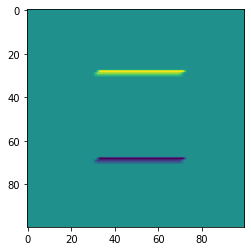

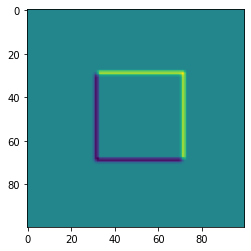

In [545]:
# Ix, Iy, It After Gradhorn
plt.imshow(Ix, label="Ix")
plt.show()
plt.imshow(Iy, label="Iy")
plt.show()
plt.imshow(It, label="It")
plt.show()

#### Testing horn() on mysine data and optimizing alpha value

In [546]:
I1 = cv2.imread("../data/mysine/mysine9.png", 0).astype(np.float32)
I2 = cv2.imread("../data/mysine/mysine10.png", 0).astype(np.float32)

In [559]:
## Correct Flow (Reference)
wr = readflo("../data/mysine/correct_mysine.flo")

## Computed Flow using horn (Estimated)
we = horn(I1, I2, 0.0001, 500)

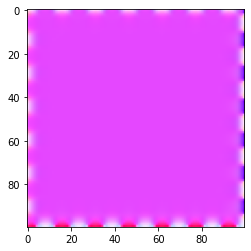

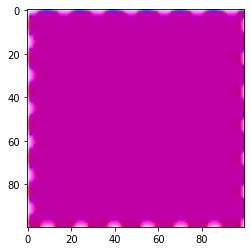

In [560]:
Ir = cv2.imread("../data/mysine/mysine_horn.png")

plt.imshow(Ir)
plt.show()

plt.imshow(computeColor(we, False))
plt.show()

In [558]:
error(wr, we)

(0.17319511849671806, 0.07748355902586182, 0.02987843527268864)

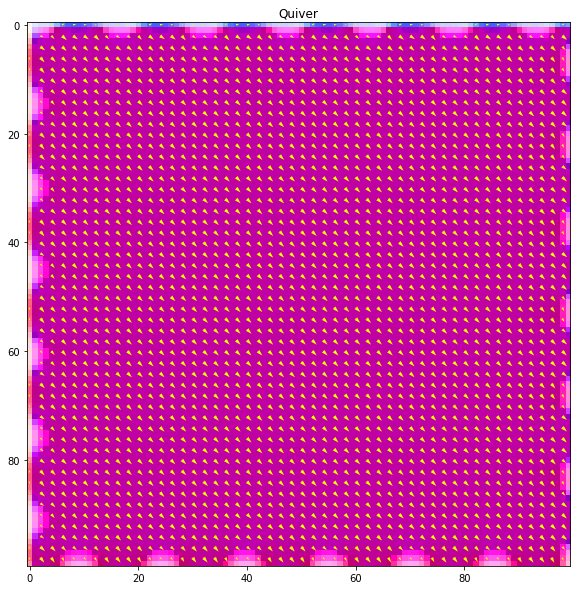

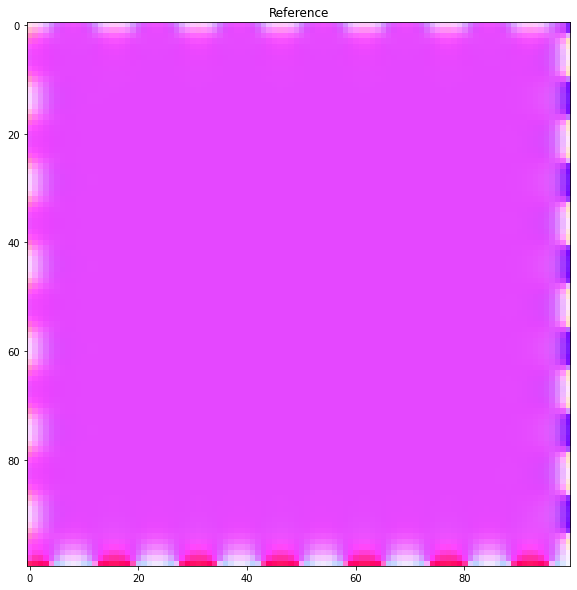

In [561]:
quiver_plot(Ir, we, n=2, color="yellow")

#### Let us optimize the alpha value to get the best alpha value

In [321]:
from tqdm import tqdm
best_a = 0
best_N = 0
previous_err = 1000
I1 = cv2.imread("../data/mysine/mysine9.png", 0).astype(np.float32)
I2 = cv2.imread("../data/mysine/mysine10.png", 0).astype(np.float32)
wr = readflo("../data/mysine/correct_mysine.flo")
pbar = tqdm(np.logspace(-4, 6, 150))
error1 = []
error2 = []
error3 = []
alphas = []
Ns = []
for alpha in pbar:
    #for N in range(0, 5, 1):
    #pbar.set_postfix({'inner': N})
    we = horn(I1, I2, alpha, 100)
    err1, err2, err3 = error(wr, we)
    error1.append(err1)
    error2.append(err2)
    error3.append(err3)
    alphas.append(alpha)

100%|█████████████████████████████████████████| 150/150 [00:17<00:00,  8.34it/s]


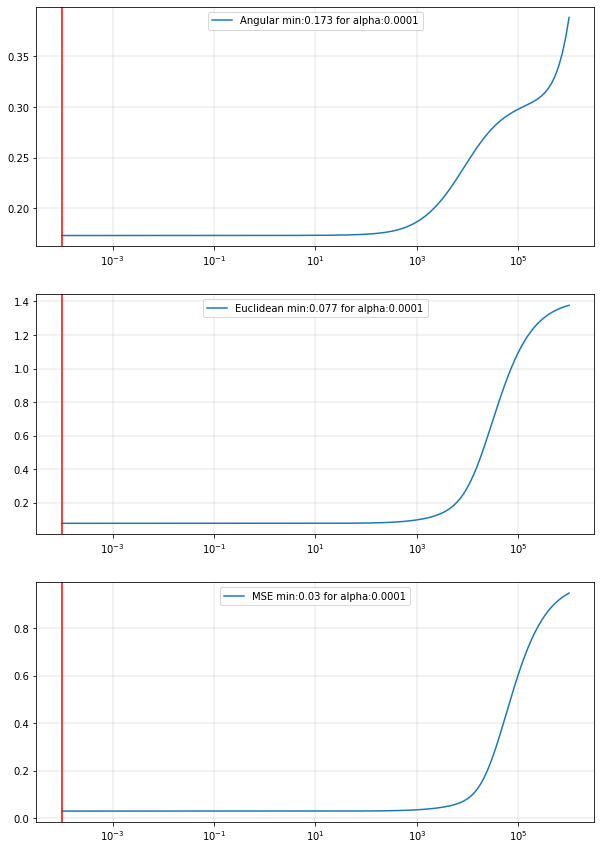

In [329]:
def subplot_errors(alphas, errors, var):
    error1 = errors[0]
    error2 = errors[1]
    error3 = errors[2]
    fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(10,15))
    ax1.plot(alphas, np.array(error1), label="Angular min:{} for {}:{}".format(round(min(error1), 3), var, round(alphas[error1.index(min(error1))], 6)))
    ax1.set_xscale('log')
    ax1.legend()
    ax1.axvline(x=alphas[error1.index(min(error1))], color="r")
    ax1.grid(color='k', linewidth=0.1)
    
    ax2.plot(alphas, np.array(error2), label="Euclidean min:{} for {}:{}".format(round(min(error2), 3), var, round(alphas[error2.index(min(error2))], 6)))
    ax2.set_xscale('log')
    ax2.legend()
    ax2.axvline(x=alphas[error2.index(min(error2))], color="r")
    ax2.grid(color='k', linewidth=0.1)

    ax3.plot(alphas, np.array(error3), label="MSE min:{} for {}:{}".format(round(min(error3), 3), var, round(alphas[error3.index(min(error3))], 6)))
    ax3.set_xscale('log')
    ax3.legend()
    ax3.axvline(x=alphas[error3.index(min(error3))], color="r")
    ax3.grid(color='k', linewidth=0.1)
subplot_errors(alphas, [error1, error2, error3], "alpha")

## 2. Lucas-Kanade

### 2.1 Lucas

In [346]:
def lucas(I1, I2, n):
    Ix, Iy, It = gradhorn(I1, I2)

    center = int(n / 2)
    u = np.zeros(I1.shape)
    v = np.zeros(I1.shape)

    # Normalize I1 and I2 ?
    
    for i in range(center, I1.shape[0] - center):
        for j in range(center, I1.shape[1] - center):
            # Extracting pixels  windows X and Y from Ix and Iy
            
            # Appliquer une pondération gaussienne sur chaque pixels par convolution dans un voisinage 
            X =  Ix[i - center:i + center + 1, j - center:j + center + 1].flatten()
            Y =  Iy[i - center:i + center + 1, j - center:j + center + 1].flatten()
            B = -It[i - center:i + center + 1, j - center:j + center + 1].flatten()
            A = np.vstack((X, Y)).T
            w = np.linalg.pinv(A.T @ A) @ A.T @ B

            u[i, j] = w[0]
            v[i, j] = w[1]

    w = np.zeros([I1.shape[0], I1.shape[1], 2])
    w[:, :, 0] = u
    w[:, :, 1] = v
    return w

In [523]:
from scipy.ndimage.filters import gaussian_filter

def gaussian_kernel(shape, sigma=1):
    kernel = np.zeros(shape)
    kernel[shape[0]//2, shape[1]//2] = 1    
    return gaussian_filter(kernel, sigma)

def lucas_gauss(I1, I2, n, sigma):
    Ix, Iy, It = gradhorn(I1, I2)
    center = int(n / 2)
    u = np.zeros(I1.shape)
    v = np.zeros(I1.shape)

    # Normalize I1 and I2 ?
    
    for i in range(center, I1.shape[0] - center):
        for j in range(center, I1.shape[1] - center):
            # Extracting pixels  windows X and Y from Ix and Iy
            
            
            # Appliquer une pondération gaussienne sur chaque pixels par convolution dans un voisinage 
            X =  Ix[i - center:i + center + 1, j - center:j + center + 1]
            Y =  Iy[i - center:i + center + 1, j - center:j + center + 1]
            B = -It[i - center:i + center + 1, j - center:j + center + 1]
            X = (X * gaussian_kernel(X.shape, sigma)).flatten()
            Y = (Y * gaussian_kernel(Y.shape, sigma)).flatten()
            B = (B * gaussian_kernel(B.shape, sigma)).flatten()
            
            A = np.vstack((X, Y)).T
            w = np.linalg.pinv(A.T @ A) @ A.T @ B

            u[i, j] = w[0]
            v[i, j] = w[1]

    w = np.zeros([I1.shape[0], I1.shape[1], 2])
    w[:, :, 0] = u
    w[:, :, 1] = v
    return w

In [524]:
I1 = cv2.imread("../data/mysine/mysine9.png", 0).astype(np.float32)
I2 = cv2.imread("../data/mysine/mysine10.png", 0).astype(np.float32)

In [525]:
## Correct Flow (Reference)
wr = readflo("../data/mysine/correct_mysine.flo")

## Computed Flow using horn (Estimated)
#we = lucas(I1, I2, 2)
we = lucas_gauss(I1, I2, 2, 50)

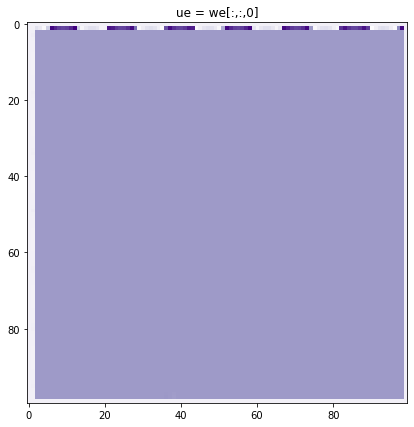

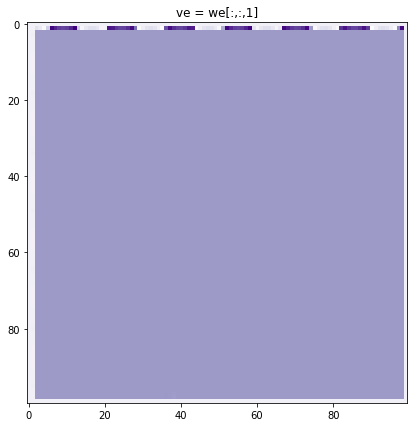

In [526]:
## Estimated optical flow over x and y directions
plt.figure(figsize=(7,7))
plt.imshow(we[:,:,0], cmap="Purples")
plt.title("ue = we[:,:,0]")
plt.show()

plt.figure(figsize=(7,7))
plt.imshow(we[:,:,1])
plt.imshow(we[:,:,0], cmap="Purples")
plt.title("ve = we[:,:,1]")
plt.show()

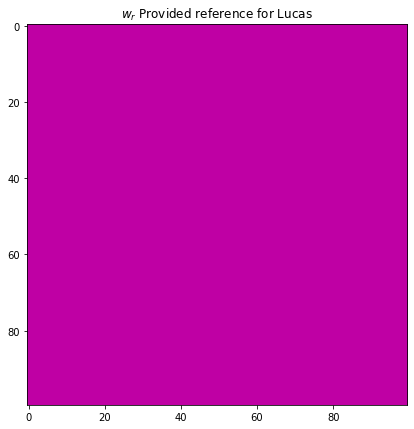

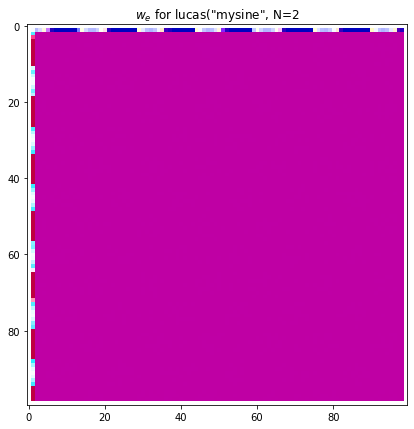

In [527]:
Ir = cv2.imread("../data/mysine/mysine_lucas.png")

plt.figure(figsize=(7,7))
plt.imshow(computeColor(wr, False))
plt.title(r'$w_r$ Provided reference for Lucas')
plt.show()

plt.figure(figsize=(7,7))
plt.imshow(computeColor(we, False))
plt.title(r'$w_e$ for lucas("mysine", N={}'.format(2))
plt.show()

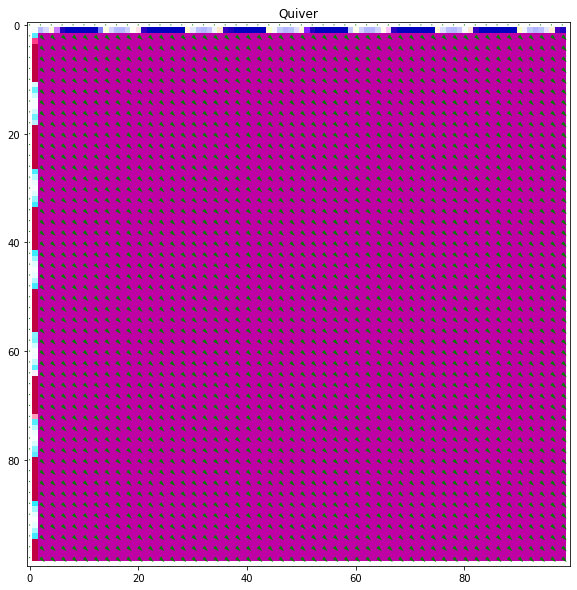

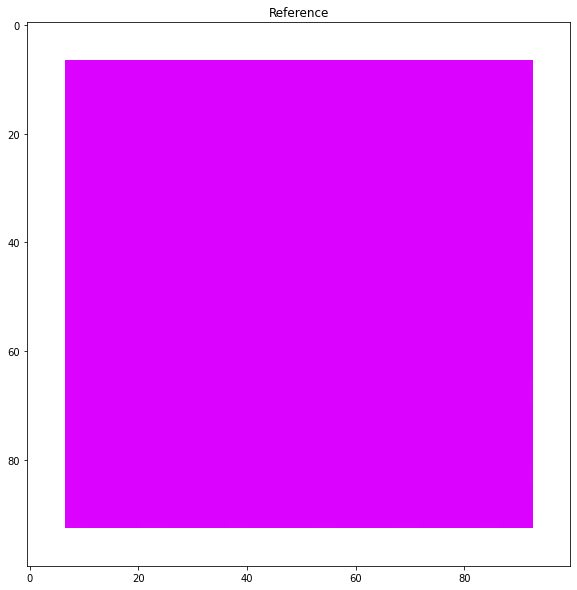

In [528]:
quiver_plot(Ir, we, n=2, color="green")

In [529]:
error(wr, we)

(0.25031579917646174, 0.08484335651143184, 0.061516855612466385)

In [1]:
# from tqdm import tqdm
# best_w = 0
# previous_err = 10e6
# wr = readflo("../data/mysine/correct_mysine.flo")
# ns = list(range(int(I1.shape[0]) - 1))
# pbar = tqdm(ns)
# error1 = []
# error2 = []
# error3 = []
# ns = []

# for n in pbar:
#     we = lucas_gauss(I1, I2, n, 1)
#     err1, err2, err3 = error(wr, we)
#     error1.append(err1)
#     error2.append(err2)
#     error3.append(err3)
#     ns.append(n)

In [ ]:
subplot_errors(ns, [error1, error2, error3], "N")

In [537]:
from tqdm import tqdm
best_w = 0
previous_err = 10e6
wr = readflo("../data/mysine/correct_mysine.flo")
sgs = np.logspace(-0.5, 2, 20)
pbar = tqdm(sgs)
error1 = []
error2 = []
error3 = []
sigmas = []

for s in pbar:
    we = lucas_gauss(I1, I2, 2, s)
    err1, err2, err3 = error(wr, we)
    error1.append(err1)
    error2.append(err2)
    error3.append(err3)
    sigmas.append(s)

100%|███████████████████████████████████████████| 20/20 [00:41<00:00,  2.08s/it]


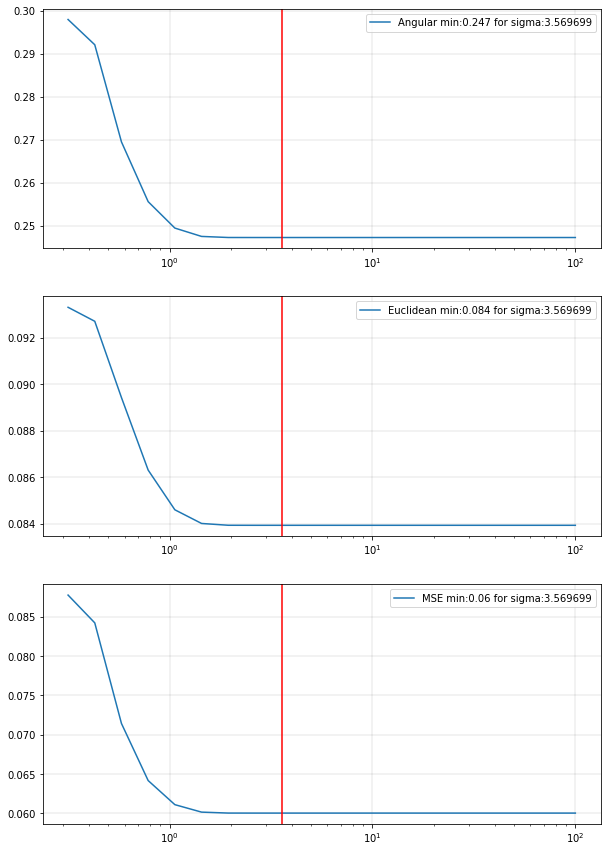

In [538]:
subplot_errors(sigmas, [error1, error2, error3], "sigma")

In [333]:
I1 = cv2.imread("../data/square/square9.png", 0).astype(np.float32)
I2 = cv2.imread("../data/square/square10.png", 0).astype(np.float32)
Ir = cv2.imread("../data/square/square_lucas.png")

In [334]:
## Correct Flow (Reference)
wr = readflo("../data/square/correct_square.flo")

## Computed Flow using horn (Estimated)
we = lucas(I1, I2, 3)

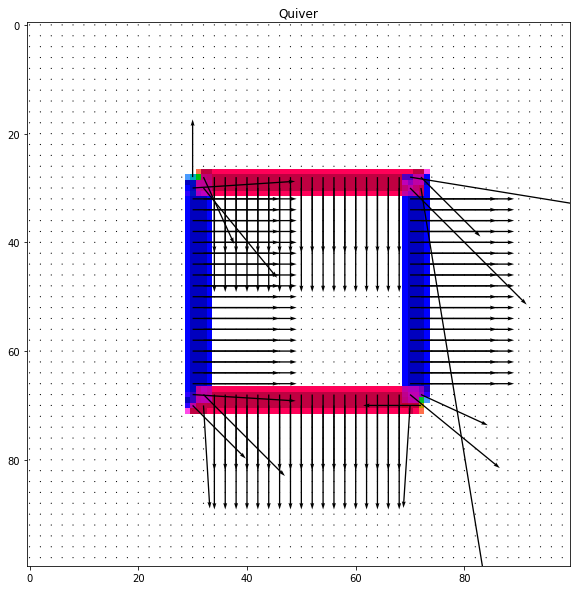

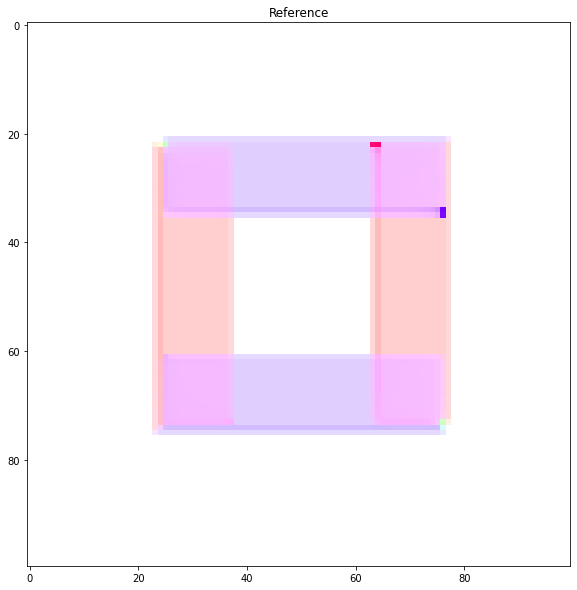

In [335]:
quiver_plot(Ir, we, n = 2, color="black")

In [ ]:
def test_lucas(i1, i2, ir, N=3, quiver=False, n=2, color="white", ):
    I1 = cv2.imread(i1, 0).astype(np.float32)
    cv2.normalize(I1,  I1, 0, 255, cv2.NORM_MINMAX)
    I2 = cv2.imread(i2, 0).astype(np.float32)
    cv2.normalize(I2,  I2, 0, 255, cv2.NORM_MINMAX)
    Ir = cv2.imread(ir)
    ## Computed Flow using horn (Estimated)
    we = lucas(I1, I2, 3)
    if quiver:
        quiver_plot(Ir, we, n, color)
    else:
        plot(Ir, we)

def test_horn(i1, i2, ir, alpha=0.001, N=4, quiver=True, nq=2, color="white"):
    I1 = cv2.imread(i1, 0).astype(np.float32)
    cv2.normalize(I1,  I1, 0, 255, cv2.NORM_MINMAX)
    I2 = cv2.imread(i2, 0).astype(np.float32)
    cv2.normalize(I2,  I2, 0, 255, cv2.NORM_MINMAX)
    Ir = cv2.imread(ir)
    ## Computed Flow using horn (Estimated)
    we = horn(I1, I2, alpha, N)
    if quiver:
        quiver_plot(Ir, we, nq, color)
    else:
        plot(Ir, we)

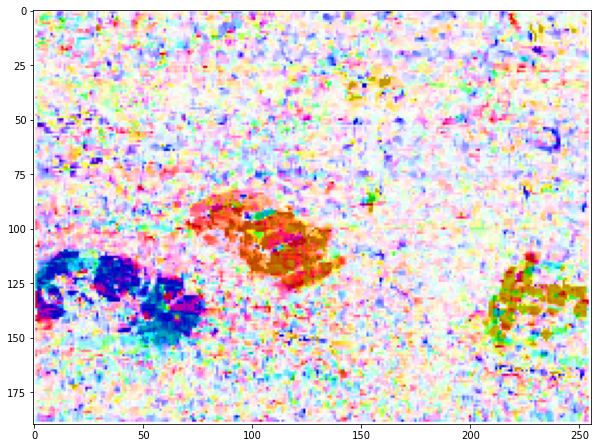

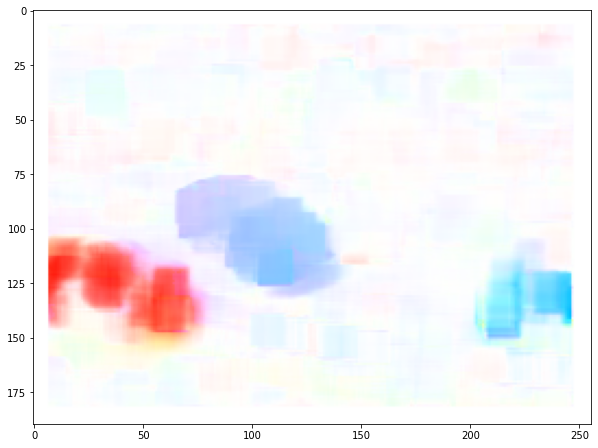

In [345]:
test_lucas("../data/taxi/taxi9.png",
           "../data/taxi/taxi10.png",
           "../data/taxi/taxi_lucas.png", 2, False)

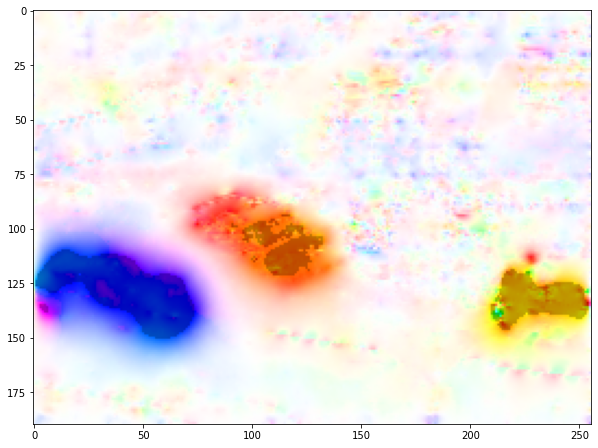

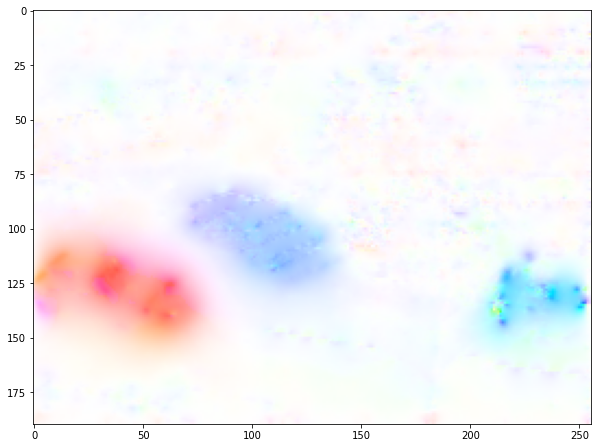

In [347]:
test_horn("../data/taxi/taxi9.png",
           "../data/taxi/taxi10.png",
           "../data/taxi/taxi_horn.png", 500, 1000, False)

### Horn vs Lucas vs Lucas with Gaussian

100%|███████████████████████████████████████████| 10/10 [01:24<00:00,  8.42s/it]


[1000000, 36, 1000000]

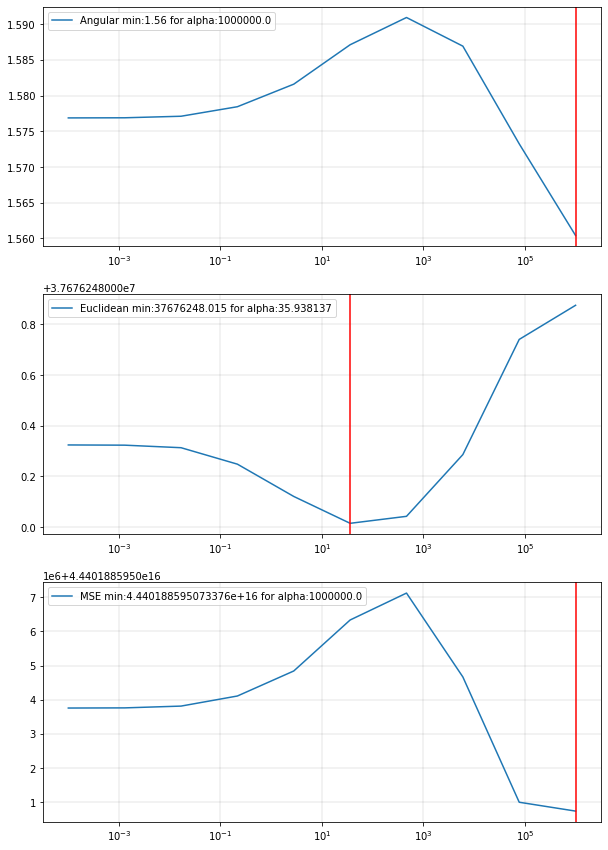

In [649]:
I1 = cv2.imread("../data/rubberwhale/frame10.png", 0).astype(np.float32)
I2 = cv2.imread("../data/rubberwhale/frame11.png", 0).astype(np.float32)
wr = readflo("../data/rubberwhale/correct_rubberwhale10.flo")
lrange = np.logspace(-4, 6, 10)
def best_horn(I1, I2, wr, N_horn, lrange):
    best_a = 0
    best_N = 0
    previous_err = 1000
    pbar = tqdm(lrange)
    error1 = []
    error2 = []
    error3 = []
    alphas = []
    Ns = []
    for alpha in pbar:
        we = horn(I1, I2, alpha, N_horn)
        err1, err2, err3 = error(wr, we)
        error1.append(err1)
        error2.append(err2)
        error3.append(err3)
        alphas.append(alpha)
    subplot_errors(alphas, [error1, error2, error3], "alpha")
    return [round(alphas[error1.index(min(error1))]),
            round(alphas[error2.index(min(error2))]),
            round(alphas[error3.index(min(error3))])]
best_horn(I1, I2, wr, 500, lrange)

In [634]:
def comparison(I, alpha_horn, N_horn, N_lucas, N_lucas_gauss, sigma_lucas_gauss):
    I1 = I[0]
    I2 = I[1]
    
    whorn , wlucas, wlucas_gauss = horn(I1, I2, alpha_horn, N_horn), lucas(I1, I2, N_lucas), lucas_gauss(I1, I2, N_lucas_gauss, sigma_lucas_gauss)
    w = [whorn , wlucas, wlucas_gauss]
    if len(I) > 2:
        wr = I[2]
        errors = []
        e = [error(wr, whorn) , error(wr, wlucas) , error(wr, wlucas_gauss)]
        return w, e
    else:
        return w, None

titles = ["Horn", "Lucas", "Lucas w/ Gaussian"]

def plot_comparison(w, e, n=2, color="black"):
    for i in range(3):
        if e is not None:
            errors = "  AP:"  + str(round(e[i][0], 4)) + \
                     "  EPE:" + str(round(e[i][1], 4)) + \
                     "  MSE:" + str(round(e[i][2], 4))
            if n < 0:
                plt.figure(figsize=(10,10))
                plt.imshow(computeColor(w[i], False))
                plt.title(titles[i] + errors)
                plt.axis("off")
            else:
                quiver_show(w[i], n=n, color=color, title=titles[i] + errors)
        else:
            quiver_show(w[i], n=n, color=color, title=titles[i])

In [630]:
I1 = cv2.imread("../data/mysine/mysine9.png", 0).astype(np.float32)
I2 = cv2.imread("../data/mysine/mysine10.png", 0).astype(np.float32)
wr = readflo("../data/mysine/correct_mysine.flo")
w_mysine, e_mysine = comparison([I1, I2, wr], alpha_horn=0.0001, N_horn=500, N_lucas=2, N_lucas_gauss=2, sigma_lucas_gauss=1)

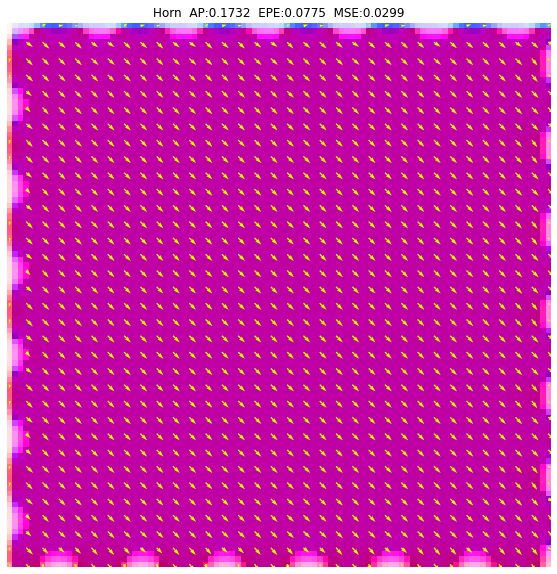

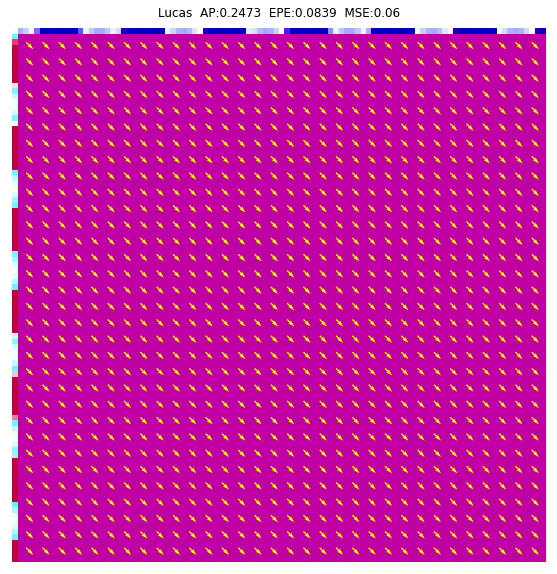

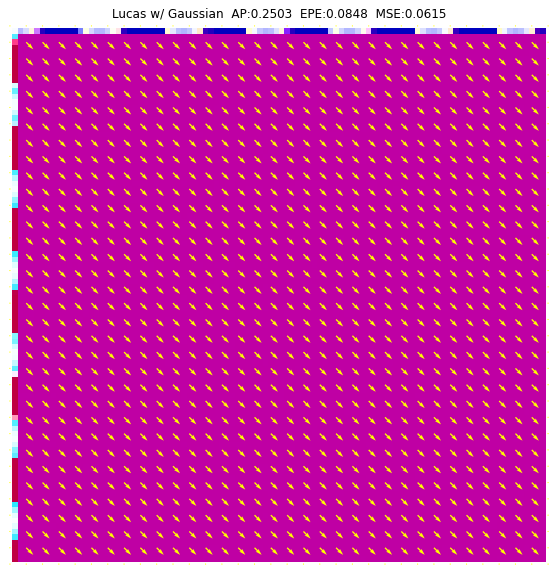

In [631]:
plot_comparison(w_mysine, e_mysine, n=3, color="yellow")

In [632]:
I1 = cv2.imread("../data/rubberwhale/frame10.png", 0).astype(np.float32)
I2 = cv2.imread("../data/rubberwhale/frame11.png", 0).astype(np.float32)
wr = readflo("../data/rubberwhale/correct_rubberwhale10.flo")
w_rub, e_rub = comparison([I1, I2, wr], alpha_horn=0.0001, N_horn=500, N_lucas=5, N_lucas_gauss=5, sigma_lucas_gauss=1)

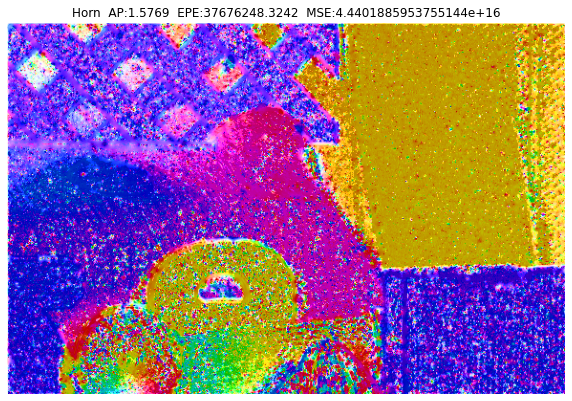

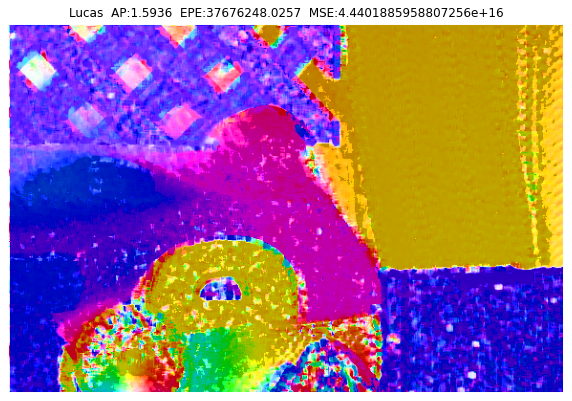

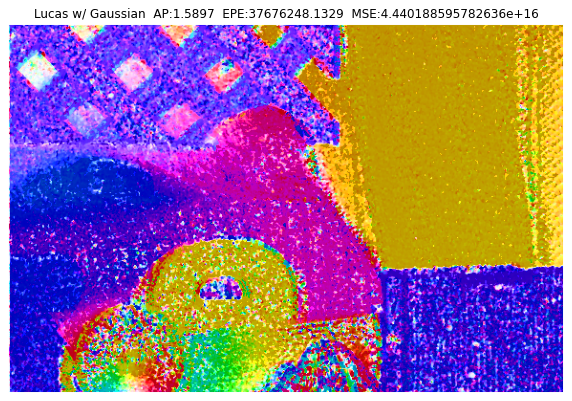

In [635]:
plot_comparison(w_rub, e_rub, n=-1)

In [667]:
I1 = cv2.imread("../data/nasa/nasa9.png", 0).astype(np.float32)
I2 = cv2.imread("../data/nasa/nasa10.png", 0).astype(np.float32)
w_nasa, e_nasa = comparison([I1, I2], alpha_horn=100, N_horn=500, N_lucas=10, N_lucas_gauss=10, sigma_lucas_gauss=0.5)

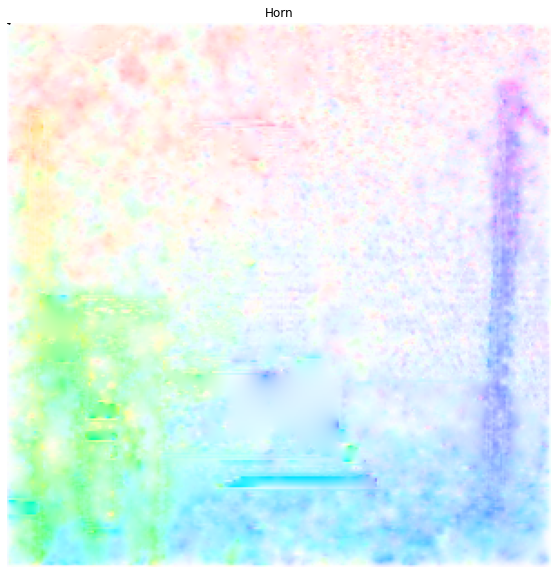

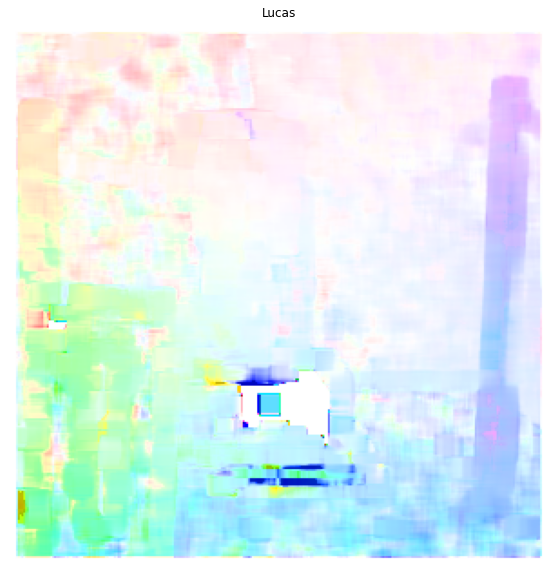

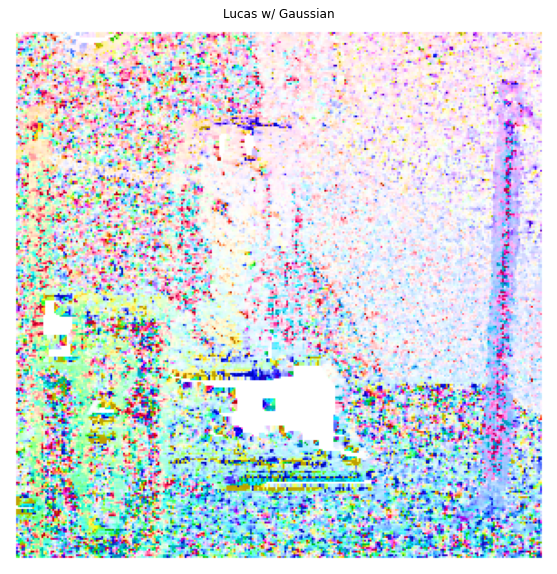

In [668]:
plot_comparison(w_nasa, e_nasa, n=500)

In [665]:
I1 = cv2.imread("../data/rubic/rubic9.png", 0).astype(np.float32)
I2 = cv2.imread("../data/rubic/rubic10.png", 0).astype(np.float32)
w_rubic, e_rubic= comparison([I1, I2], alpha_horn=100, N_horn=500, N_lucas=2, N_lucas_gauss=2, sigma_lucas_gauss=1)

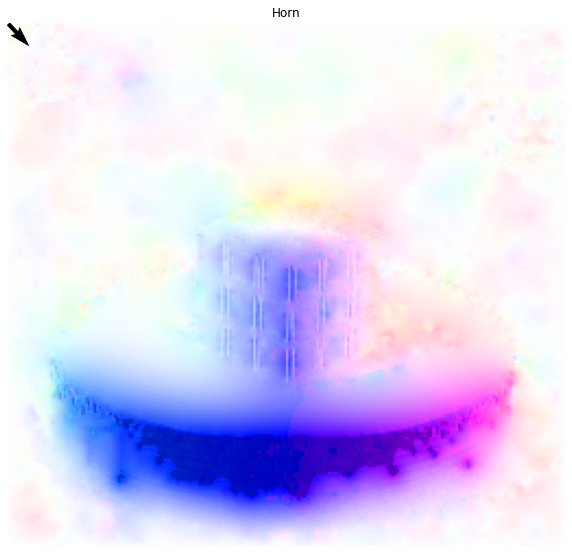

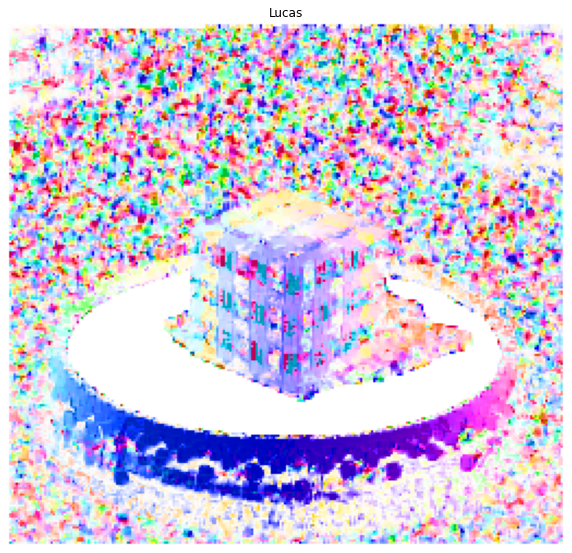

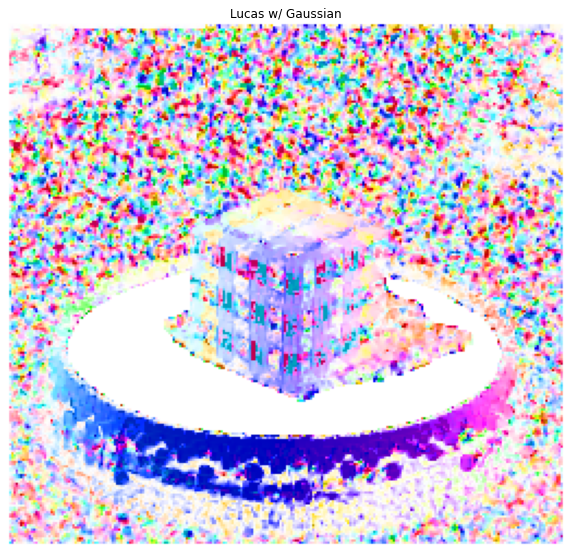

In [666]:
plot_comparison(w_rubic, e_rubic, n=10000)

In [659]:
I1 = cv2.imread("../data/taxi/taxi9.png", 0).astype(np.float32)
I2 = cv2.imread("../data/taxi/taxi10.png", 0).astype(np.float32)
w_tax, e_tax= comparison([I1, I2], alpha_horn=500, N_horn=1000, N_lucas=10, N_lucas_gauss=10, sigma_lucas_gauss=3.5)

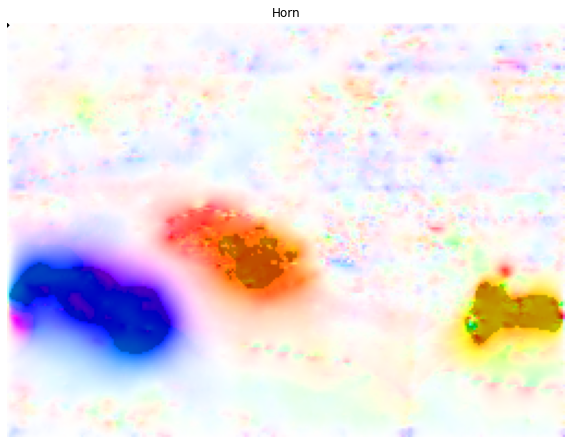

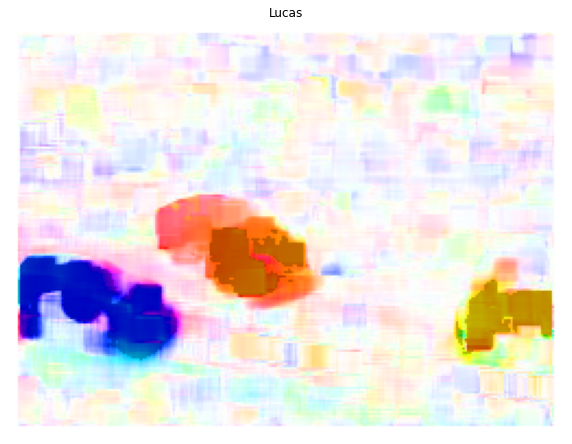

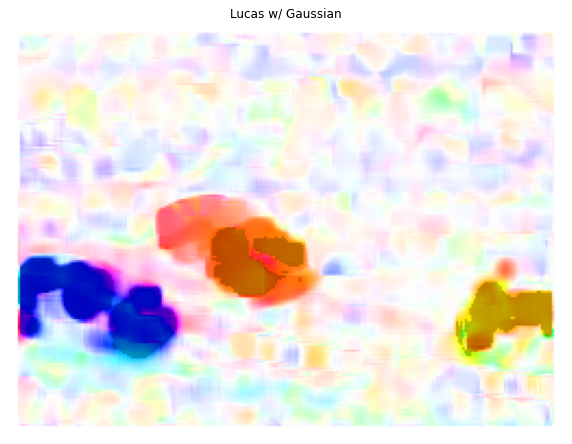

In [660]:
plot_comparison(w_tax, e_tax, n=10000)

In [661]:
I1 = cv2.imread("../data/yosemite/yos9.png", 0).astype(np.float32)
I2 = cv2.imread("../data/yosemite/yos10.png", 0).astype(np.float32)
wr = readflo("../data/yosemite/correct_yos.flo")
w_yos, e_yos= comparison([I1, I2], alpha_horn=500, N_horn=1000, N_lucas=10, N_lucas_gauss=10, sigma_lucas_gauss=1)

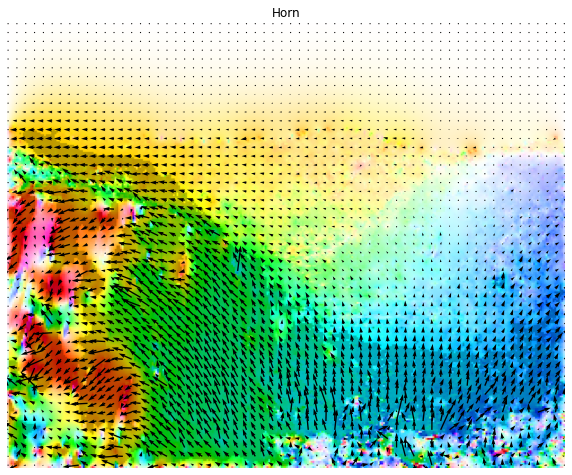

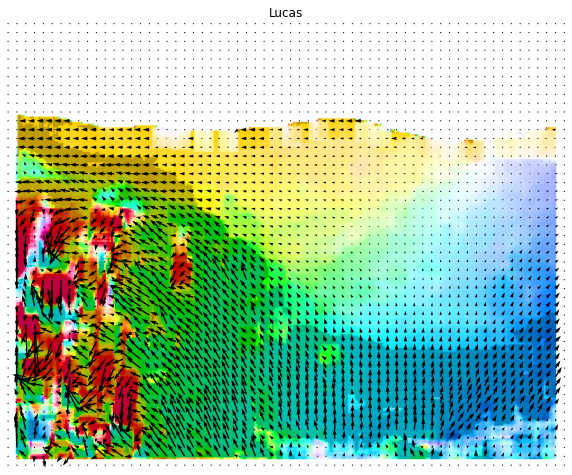

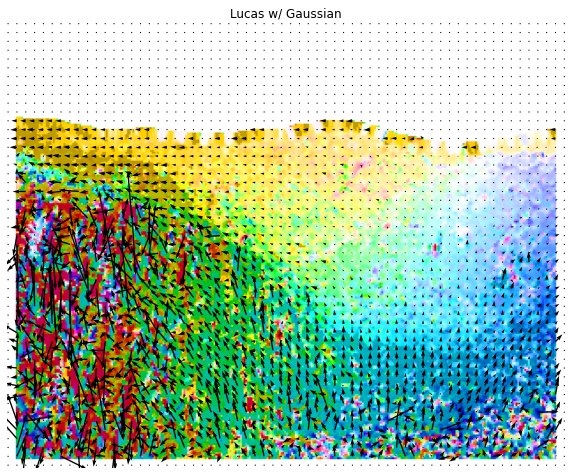

In [664]:
plot_comparison(w_yos, e_yos, n=5)

### More Tests

In [42]:
data = "other/RubberWhale/"
imgs=os.listdir(data)
flo_file = None
for im in imgs[:]:
    if im.endswith(".flo"):
        flo_file = im
    if not(im.endswith(".png")):
        imgs.remove(im)
print(imgs, flo_file)

['frame07.png', 'frame08.png', 'frame09.png', 'frame10.png', 'frame11.png', 'frame12.png', 'frame13.png', 'frame14.png'] flow10.flo


In [43]:
frames = [cv2.imread(data + i, 0).astype(np.float32) for i in imgs]
gt = readflo(data + flo_file)

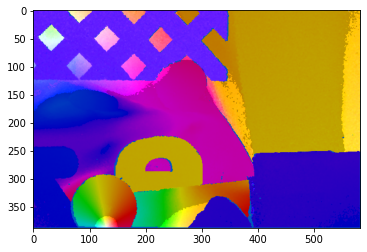

In [44]:
plt.imshow(computeColor(gt, False))

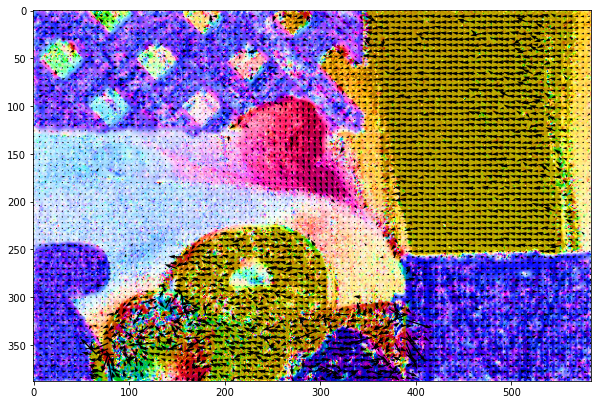

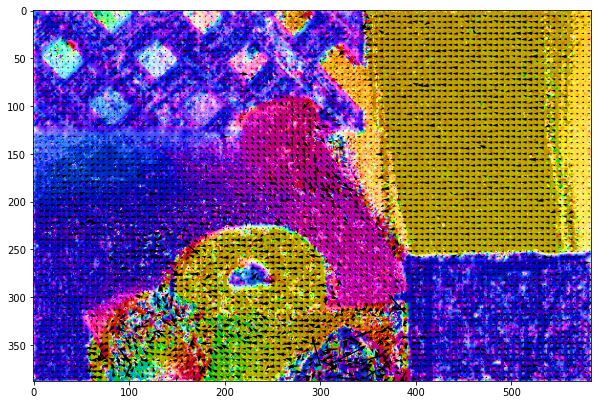

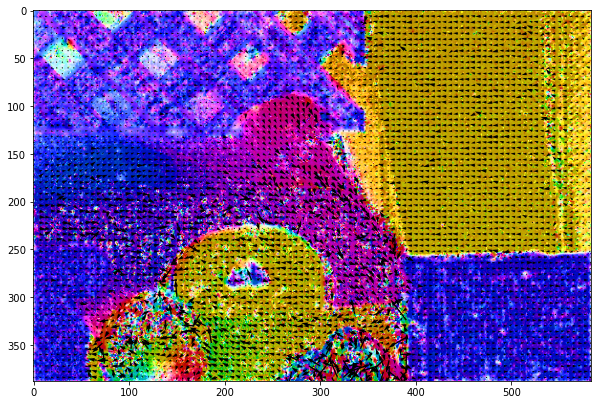

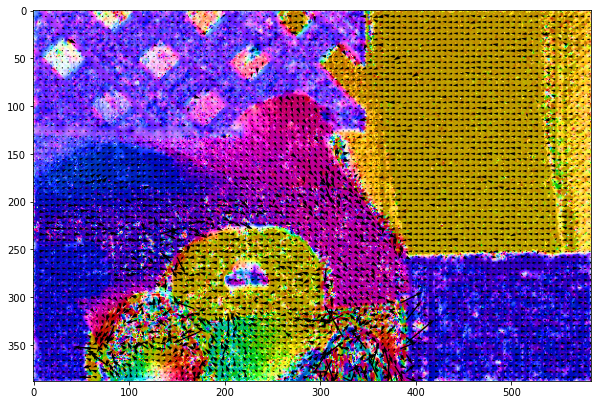

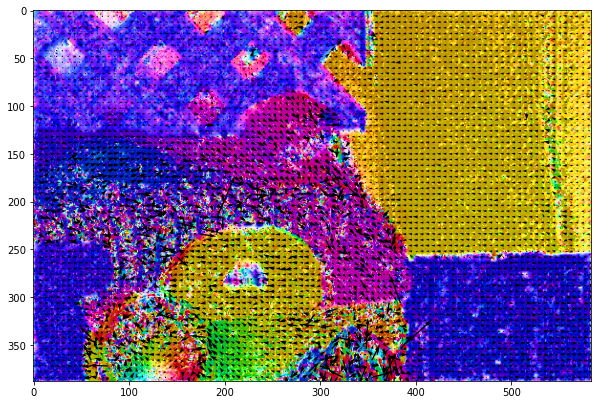

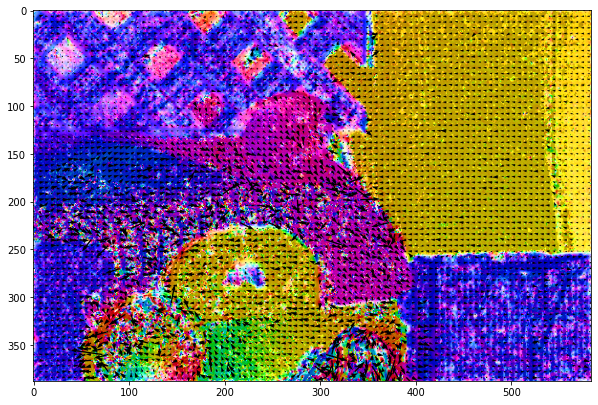

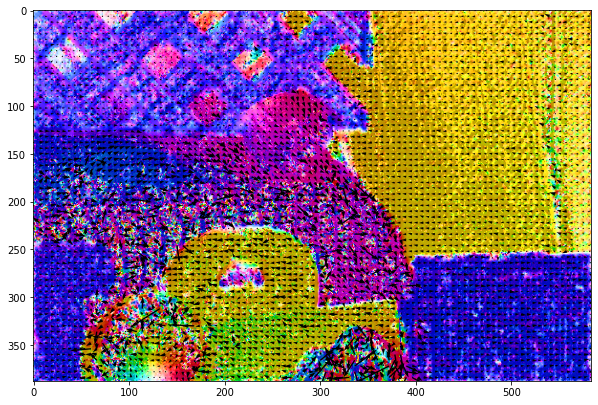

In [45]:
frames_lucas = []
for i in range(1, len(frames)):
    #w = lucas(frames[i - 1], frames[i], 7)
    w = horn(frames[i - 1], frames[i], 1.4, 250)
    #plt.imshow(computeColor(w, False))
    quiver_show(w, n=6, color="black")
    plt.show()
    frames_lucas.append(w)

In [48]:
np.save("frames_lucas_rubberwhale.npy", frames_lucas)

In [49]:
frames_lucas = np.load("frames_lucas_rubberwhale.npy")

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation

we = frames_lucas[0]
U = we[:,:,0]
V = we[:,:,1]
w, h = U.shape
X, Y = np.meshgrid(list(range(U.shape[1])), list(range(U.shape[0])))
#plt.quiver(X[::n, ::n], Y[::n, ::n], U[::n, ::n], V[::n, ::n], color=color)

n = 6
fig = plt.figure(frameon=False, figsize=(int(h/20), int(w/20)))
ax = fig.add_axes([0, 0, 1, 1])
ax.invert_yaxis()
ax.axis('off')
#ax.imshow(computeColor(we, False), aspect="auto")
ax.imshow(frames[0], aspect="auto")
Q = ax.quiver(X[::n, ::n], Y[::n, ::n], U[::n, ::n], V[::n, ::n])

i = 0

def update_quiver(num, Q, X, Y):

    global i
    global n
    if i != 0 and i % 6 == 0:
        i = 0
    else:
        i += 1
    we = frames_lucas[i]
    U = we[:,:,0]
    V = we[:,:,1]

    print(i)
   
#   Q = ax.quiver(X[::n, ::n], Y[::n, ::n], U[::n, ::n], V[::n, ::n])
    #ax.imshow(computeColor(we, False),  aspect="auto")
    ax.imshow(frames[i], aspect="auto")
    Q.set_UVC(U[::n, ::n], V[::n, ::n])
    
    return Q,

# you need to set blit=False, or the first set of arrows never gets
# cleared on subsequent frames
anim = animation.FuncAnimation(fig, update_quiver, fargs=(Q, X, Y),
                               interval=25, blit=False)

writergif = animation.PillowWriter(fps=5) 
anim.save("animation1.gif", writer=writergif)

#writermp4 = animation.FFMpegWriter(fps=15) 
#anim.save("/home/shubh/Desktop/animation.mp4", writer=writermp4)
#anim.save('animated.mp4',fps=15,extra_args=['-vcodec','libx264'])

plt.show()

In [ ]:
!ls